In [1]:
!pip install cudf-cu12 --extra-index-url=https://pypi.nvidia.com

Looking in indexes: https://pypi.org/simple, https://pypi.nvidia.com


In [2]:
import cudf as cpd
import plotly.express as px
import numpy as np

In [3]:
from google.colab import files

In [4]:
files.upload()


Saving kaggle (1).json to kaggle (1).json


{'kaggle (1).json': b'{"username":"farahelmashad","key":"8ac7dd77d53b209d0c0297a9bce5747b"}'}

In [5]:
!pip install kagglehub

In [6]:
import kagglehub

# Download latest version of the dataset
path = kagglehub.dataset_download("sobhanmoosavi/us-accidents")

print("Path to dataset files:", path)

100%|██████████| 653M/653M [00:31<00:00, 21.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/sobhanmoosavi/us-accidents/versions/13


In [7]:
import os

In [8]:
folder = '/root/.cache/kagglehub/datasets/sobhanmoosavi/us-accidents/versions/13'
csv_path = os.path.join(folder, 'US_Accidents_March23.csv')

In [9]:
dff=cpd.read_csv(csv_path)
dff.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,<NA>,<NA>,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,<NA>,<NA>,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,<NA>,<NA>,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,<NA>,<NA>,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,<NA>,<NA>,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [10]:
dff.info()

<class 'cudf.core.dataframe.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 46 columns):
 #   Column                 Dtype
---  ------                 -----
 0   ID                     object
 1   Source                 object
 2   Severity               int64
 3   Start_Time             object
 4   End_Time               object
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object
 11  Street                 object
 12  City                   object
 13  County                 object
 14  State                  object
 15  Zipcode                object
 16  Country                object
 17  Timezone               object
 18  Airport_Code           object
 19  Weather_Timestamp      object
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 22  Humidity(%)            float64
 23  

In [11]:
dff.isnull().sum()

ID                             0
Source                         0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                  3402762
End_Lng                  3402762
Distance(mi)                   0
Description                    5
Street                     10869
City                         253
County                         0
State                          0
Zipcode                     1915
Country                        0
Timezone                    7808
Airport_Code               22635
Weather_Timestamp         120228
Temperature(F)            163853
Wind_Chill(F)            1999019
Humidity(%)               174144
Pressure(in)              140679
Visibility(mi)            177098
Wind_Direction            175206
Wind_Speed(mph)           571233
Precipitation(in)        2203586
Weather_Condition         173459
Amenity                        0
Bump      

In [12]:
dff.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [13]:
time_of_day_columns=['Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight']
for column in time_of_day_columns:
  print(dff[column].unique())

0    Night
1      Day
2     <NA>
Name: Sunrise_Sunset, dtype: object
0    Night
1      Day
2     <NA>
Name: Civil_Twilight, dtype: object
0    Night
1      Day
2     <NA>
Name: Nautical_Twilight, dtype: object
0    Night
1      Day
2     <NA>
Name: Astronomical_Twilight, dtype: object


In [14]:
dff.drop(columns=time_of_day_columns, inplace=True)

In [15]:
dff.isnull().sum()

ID                         0
Source                     0
Severity                   0
Start_Time                 0
End_Time                   0
Start_Lat                  0
Start_Lng                  0
End_Lat              3402762
End_Lng              3402762
Distance(mi)               0
Description                5
Street                 10869
City                     253
County                     0
State                      0
Zipcode                 1915
Country                    0
Timezone                7808
Airport_Code           22635
Weather_Timestamp     120228
Temperature(F)        163853
Wind_Chill(F)        1999019
Humidity(%)           174144
Pressure(in)          140679
Visibility(mi)        177098
Wind_Direction        175206
Wind_Speed(mph)       571233
Precipitation(in)    2203586
Weather_Condition     173459
Amenity                    0
Bump                       0
Crossing                   0
Give_Way                   0
Junction                   0
No_Exit       

In [16]:
# getting the percentage of nulls in each column:
dff.isnull().sum()/len(dff)*100

ID                    0.000000
Source                0.000000
Severity              0.000000
Start_Time            0.000000
End_Time              0.000000
Start_Lat             0.000000
Start_Lng             0.000000
End_Lat              44.029355
End_Lng              44.029355
Distance(mi)          0.000000
Description           0.000065
Street                0.140637
City                  0.003274
County                0.000000
State                 0.000000
Zipcode               0.024779
Country               0.000000
Timezone              0.101030
Airport_Code          0.292881
Weather_Timestamp     1.555666
Temperature(F)        2.120143
Wind_Chill(F)        25.865904
Humidity(%)           2.253301
Pressure(in)          1.820288
Visibility(mi)        2.291524
Wind_Direction        2.267043
Wind_Speed(mph)       7.391355
Precipitation(in)    28.512858
Weather_Condition     2.244438
Amenity               0.000000
Bump                  0.000000
Crossing              0.000000
Give_Way

In [17]:
# almost half the data is missing for the end lat and long , will drop:
dff.drop(columns=['End_Lat', 'End_Lng'], inplace=True)

In [18]:
dff.Description.unique()

0          Right lane blocked due to accident on I-70 Eas...
1          Accident on Brice Rd at Tussing Rd. Expect del...
2          Accident on OH-32 State Route 32 Westbound at ...
3          Accident on I-75 Southbound at Exits 52 52B US...
4          Accident on McEwen Rd at OH-725 Miamisburg Cen...
                                 ...                        
3761574      At Auto Center Dr - Accident. in the left lane.
3761575    Ramp closed to Bristol St/Exit 9 - Road closed...
3761576    Ramp closed to Bristol St - Road closed due to...
3761577        At Friars Rd - Accident. Center lane blocked.
3761578    Ramp closed to The City Dr/Exit 14A - Road clo...
Name: Description, Length: 3761579, dtype: object

In [19]:
dff.dropna(subset=['Description'], inplace=True)

In [20]:
dff['Street'].unique()

0                            I-70 E
1                          Brice Rd
2                    State Route 32
3                            I-75 S
4         Miamisburg Centerville Rd
                    ...            
336302               Darden Farm Ln
336303                  Bushnell St
336304                 N Digital Dr
336305                San Marlo Way
336306            473-401 Cutoff Rd
Name: Street, Length: 336307, dtype: object

In [21]:
dff['Street'].isnull().sum()

np.int64(10869)

In [22]:
dff.drop(columns=['Street'], inplace=True)

In [23]:
import pandas as pd

In [24]:
# getting the city using reverse geocode:
pdf = dff[['Start_Lat', 'Start_Lng', 'City']].to_pandas()

from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="accident_analysis")

def get_city(lat, lng):
    try:
        location = geolocator.reverse((lat, lng), timeout=10)
        if location and 'city' in location.raw['address']:
            return location.raw['address']['city']
        elif location and 'town' in location.raw['address']:
            return location.raw['address']['town']
        elif location and 'village' in location.raw['address']:
            return location.raw['address']['village']
        else:
            return None
    except:
        return None

pdf['City'] = pdf.apply(lambda row: get_city(row['Start_Lat'], row['Start_Lng']) if pd.isnull(row['City']) else row['City'], axis=1)



In [25]:
dff['City']=cpd.Series(pdf['City'])

In [26]:
dff.dropna(subset=['City'], inplace=True)

In [27]:
dff['City'].isnull().sum()

np.int64(0)

In [28]:
dff.dropna(subset=['Zipcode'], inplace=True)

In [29]:
dff['ID'].unique().count()
# no duplicates

7726410

In [30]:
dff.shape

(7726410, 39)

In [31]:
dff.isnull().sum()

ID                         0
Source                     0
Severity                   0
Start_Time                 0
End_Time                   0
Start_Lat                  0
Start_Lng                  0
Distance(mi)               0
Description                0
City                       0
County                     0
State                      0
Zipcode                    0
Country                    0
Timezone                5893
Airport_Code           20720
Weather_Timestamp     118313
Temperature(F)        161938
Wind_Chill(F)        1997072
Humidity(%)           172229
Pressure(in)          138763
Visibility(mi)        175181
Wind_Direction        173290
Wind_Speed(mph)       569314
Precipitation(in)    2201642
Weather_Condition     171541
Amenity                    0
Bump                       0
Crossing                   0
Give_Way                   0
Junction                   0
No_Exit                    0
Railway                    0
Roundabout                 0
Station       

In [32]:
dff['Timezone'].unique()

0     US/Eastern
1     US/Pacific
2     US/Central
3    US/Mountain
4           <NA>
Name: Timezone, dtype: object

In [33]:
pdf=dff[['City', 'Timezone']].to_pandas()

In [34]:
pdf['Timezone'] = pdf['Timezone'].fillna(
    pdf['City'].map(
        pdf.groupby('City')['Timezone'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
    )
)


In [35]:
dff['Timezone']=cpd.Series(pdf['Timezone'])

In [36]:
dff['Timezone'].isnull().sum()

np.int64(183)

In [37]:
pdf=dff[['County', 'Timezone']].to_pandas()

In [38]:
pdf['Timezone'] = pdf['Timezone'].fillna(
    pdf['County'].map(
        pdf.groupby('County')['Timezone'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
    )
)


In [39]:
dff['Timezone']=cpd.Series(pdf['Timezone'])

In [40]:
dff['Timezone'].isnull().sum()

np.int64(0)

In [41]:
dff.isnull().sum()

ID                         0
Source                     0
Severity                   0
Start_Time                 0
End_Time                   0
Start_Lat                  0
Start_Lng                  0
Distance(mi)               0
Description                0
City                       0
County                     0
State                      0
Zipcode                    0
Country                    0
Timezone                   0
Airport_Code           20720
Weather_Timestamp     118313
Temperature(F)        161938
Wind_Chill(F)        1997072
Humidity(%)           172229
Pressure(in)          138763
Visibility(mi)        175181
Wind_Direction        173290
Wind_Speed(mph)       569314
Precipitation(in)    2201642
Weather_Condition     171541
Amenity                    0
Bump                       0
Crossing                   0
Give_Way                   0
Junction                   0
No_Exit                    0
Railway                    0
Roundabout                 0
Station       

In [42]:
dff.drop(columns=['Airport_Code'], inplace=True)

In [43]:
dff.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Weather_Timestamp', 'Temperature(F)',
       'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
       'Wind_Direction', 'Wind_Speed(mph)', 'Precipitation(in)',
       'Weather_Condition', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'],
      dtype='object')

In [44]:
dff.loc[:,['Start_Time','Weather_Timestamp']]

,Start_Time,Weather_Timestamp
0,2016-02-08 05:46:00,2016-02-08 05:58:00
1,2016-02-08 06:07:59,2016-02-08 05:51:00
2,2016-02-08 06:49:27,2016-02-08 06:56:00
3,2016-02-08 07:23:34,2016-02-08 07:38:00
4,2016-02-08 07:39:07,2016-02-08 07:53:00
...,...,...
7728389,2019-08-23 18:03:25,2019-08-23 17:53:00
7728390,2019-08-23 19:11:30,2019-08-23 18:53:00
7728391,2019-08-23 19:00:21,2019-08-23 18:53:00
7728392,2019-08-23 19:00:21,2019-08-23 18:51:00


In [45]:
# almost similar timestamps, will drop:
dff.drop(columns=['Weather_Timestamp'], inplace=True)

In [46]:
weather_cols=[ 'Visibility(mi)',
       'Wind_Direction']
for column in weather_cols:
  print(dff[column].unique())

0      10.0
1       9.0
2       6.0
3       7.0
4       5.0
      ...  
88     22.0
89    110.0
90    130.0
91     63.0
92     43.0
Name: Visibility(mi), Length: 93, dtype: float64
0         Calm
1           SW
2          SSW
3          WSW
4          WNW
5           NW
6         West
7          NNW
8          NNE
9        South
10       North
11    Variable
12          SE
13         SSE
14         ESE
15        East
16          NE
17         ENE
18           E
19           W
20        <NA>
21           S
22         VAR
23        CALM
24           N
Name: Wind_Direction, dtype: object


In [47]:
dff.drop(columns=['Wind_Direction'], inplace=True)

In [48]:
dff['Severity'].unique()

0    3
1    2
2    1
3    4
Name: Severity, dtype: int64

In [49]:
dff['Weather_Condition'].unique()

0                     Light Rain
1                       Overcast
2                  Mostly Cloudy
3                           Rain
4                     Light Snow
                 ...            
140                 Sand / Windy
141    Heavy Rain Shower / Windy
142          Blowing Snow Nearby
143            Heavy Rain Shower
144                Drifting Snow
Name: Weather_Condition, Length: 145, dtype: object

In [50]:
numeric_weather=['Temperature(F)',
       'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
        'Wind_Speed(mph)', 'Precipitation(in)']
pdf=dff[numeric_weather].to_pandas()

In [51]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

weather_data = pdf[numeric_weather]

imputer = IterativeImputer(random_state=0)

weather_imputed = imputer.fit_transform(weather_data)

pdf[numeric_weather] = pd.DataFrame(weather_imputed, columns=numeric_weather)


/usr/local/lib/python3.11/dist-packages/sklearn/impute/_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [52]:
dff[numeric_weather]=cpd.DataFrame(pdf[numeric_weather])

In [53]:
dff.isnull().sum()

ID                        0
Source                    0
Severity                  0
Start_Time                0
End_Time                  0
Start_Lat                 0
Start_Lng                 0
Distance(mi)              0
Description               0
City                      0
County                    0
State                     0
Zipcode                   0
Country                   0
Timezone                  0
Temperature(F)         1983
Wind_Chill(F)          1983
Humidity(%)            1983
Pressure(in)           1983
Visibility(mi)         1983
Wind_Speed(mph)        1983
Precipitation(in)      1983
Weather_Condition    171541
Amenity                   0
Bump                      0
Crossing                  0
Give_Way                  0
Junction                  0
No_Exit                   0
Railway                   0
Roundabout                0
Station                   0
Stop                      0
Traffic_Calming           0
Traffic_Signal            0
Turning_Loop        

In [54]:
dff.drop(columns='Weather_Condition', inplace=True)

In [55]:
dff.dropna(subset=['Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)'], inplace=True)

In [56]:
dff.isnull().sum()

ID                   0
Source               0
Severity             0
Start_Time           0
End_Time             0
Start_Lat            0
Start_Lng            0
Distance(mi)         0
Description          0
City                 0
County               0
State                0
Zipcode              0
Country              0
Timezone             0
Temperature(F)       0
Wind_Chill(F)        0
Humidity(%)          0
Pressure(in)         0
Visibility(mi)       0
Wind_Speed(mph)      0
Precipitation(in)    0
Amenity              0
Bump                 0
Crossing             0
Give_Way             0
Junction             0
No_Exit              0
Railway              0
Roundabout           0
Station              0
Stop                 0
Traffic_Calming      0
Traffic_Signal       0
Turning_Loop         0
dtype: int64

In [57]:
dff.shape

(7724427, 35)

In [58]:
dff.info()

<class 'cudf.core.dataframe.DataFrame'>
Index: 7724427 entries, 0 to 7726409
Data columns (total 35 columns):
 #   Column             Dtype
---  ------             -----
 0   ID                 object
 1   Source             object
 2   Severity           int64
 3   Start_Time         object
 4   End_Time           object
 5   Start_Lat          float64
 6   Start_Lng          float64
 7   Distance(mi)       float64
 8   Description        object
 9   City               object
 10  County             object
 11  State              object
 12  Zipcode            object
 13  Country            object
 14  Timezone           object
 15  Temperature(F)     float64
 16  Wind_Chill(F)      float64
 17  Humidity(%)        float64
 18  Pressure(in)       float64
 19  Visibility(mi)     float64
 20  Wind_Speed(mph)    float64
 21  Precipitation(in)  float64
 22  Amenity            bool
 23  Bump               bool
 24  Crossing           bool
 25  Give_Way           bool
 26  Junction          

In [59]:
dff['Start_Time'].sample()

2635870    2018-08-14 07:41:34
Name: Start_Time, dtype: object

In [60]:

df_=dff['Start_Time'].to_pandas()

In [63]:
pdf.columns

Index(['Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
       'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)'],
      dtype='object')

In [66]:
pdf['Start_Time']=dff['Start_Time'].to_pandas()

In [67]:
df_['Start_Time'] = pd.to_datetime(pdf['Start_Time'],format="%Y-%m-%d %H:%M:%S", errors='coerce')

In [68]:
print(df_['Start_Time'].dtype)

datetime64[ns]


In [69]:
dff['Start_Time']=cpd.Series(df_['Start_Time'])

In [70]:
dff=dff.sort_values(by='Start_Time', ascending=False)

In [71]:
dff_sorted=dff.head(100000)

In [72]:
df=dff_sorted.to_pandas()

In [73]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,City,...,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop
3662007,A-3682074,Source1,2,2023-03-31 23:30:00,2023-03-31 23:53:00,42.419172,-83.088509,0.911,Slow traffic on Chrysler Expy N - I-75 N - Chr...,Highland Park,...,False,False,False,False,False,False,False,False,False,False
3659354,A-3678205,Source1,2,2023-03-31 23:25:30,2023-03-31 23:38:30,34.068219,-117.384067,0.463,Stationary traffic on San Bernardino Fwy E - I...,Bloomington,...,False,False,False,False,False,False,False,False,False,False
3647141,A-3660237,Source1,2,2023-03-31 23:21:00,2023-03-31 23:38:30,38.361154,-121.970167,0.502,Slow traffic on I-80 W from Allison Dr/Monte V...,Vacaville,...,False,False,False,False,False,False,False,False,False,False
3665682,A-3687382,Source1,2,2023-03-31 23:19:00,2023-03-31 23:40:00,42.959427,-85.672227,0.129,Stationary traffic from exit [84A] to US-131 S...,Grand Rapids,...,False,True,False,False,False,False,False,False,False,False
3677613,A-3705055,Source1,2,2023-03-31 23:12:55,2023-03-31 23:42:55,41.577819,-87.562150,0.188,At I-294 - Accident.,Lansing,...,False,False,False,False,False,False,False,False,False,False


In [74]:
df.tail()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,City,...,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop
4153674,A-4184940,Source1,2,2023-01-23 07:05:14,2023-01-23 08:22:59,34.543213,-92.752108,0.224,Incident on US-70 EB near STATE HWY-88 Right s...,Benton,...,False,False,False,False,False,False,False,False,False,False
3963283,A-3993019,Source1,2,2023-01-23 07:05:00,2023-01-23 11:52:30,34.045464,-118.167003,0.104,Incident on CORPORATE CENTER DR near HOUSE 160...,Monterey Park,...,False,False,False,False,False,False,False,False,False,False
4286929,A-4319307,Source1,2,2023-01-23 07:05:00,2023-01-23 07:58:00,30.580341,-90.504235,1.031,Stationary traffic on I-55 N from LA-442 (I-55...,Tickfaw,...,False,False,False,False,False,False,False,False,False,False
4652247,A-4687524,Source1,2,2023-01-23 07:04:03,2023-01-23 08:19:18,45.068829,-93.263480,0.830,Incident on I-694 WB near UNIVERSITY AVE Drive...,Minneapolis,...,False,False,False,False,False,False,False,False,False,False
4933902,A-4971302,Source1,2,2023-01-23 07:04:03,2023-01-23 08:19:18,45.068831,-93.264271,0.208,Incident on I-694 WB near UNIVERSITY AVE Drive...,Minneapolis,...,False,False,False,False,False,False,False,False,False,False


In [75]:
df.isnull().sum()

,0
ID,0
Source,0
Severity,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
Distance(mi),0
Description,0
City,0


In [76]:
df.shape

(100000, 35)

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 3662007 to 4933902
Data columns (total 35 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ID                 100000 non-null  object        
 1   Source             100000 non-null  object        
 2   Severity           100000 non-null  int64         
 3   Start_Time         100000 non-null  datetime64[ns]
 4   End_Time           100000 non-null  object        
 5   Start_Lat          100000 non-null  float64       
 6   Start_Lng          100000 non-null  float64       
 7   Distance(mi)       100000 non-null  float64       
 8   Description        100000 non-null  object        
 9   City               100000 non-null  object        
 10  County             100000 non-null  object        
 11  State              100000 non-null  object        
 12  Zipcode            100000 non-null  object        
 13  Country            100000 non-null  object

In [78]:
df.describe()

,Severity,Start_Time,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,100000.00000,100000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,2.06054,2023-02-14 16:59:32.184260096,36.866624,-99.207479,0.98653,58.602584,56.961597,63.446708,29.308113,8.911826,7.898894,0.006978
min,2.00000,2023-01-23 07:04:03,24.570087,-124.472569,0.00000,-35.000000,-41.000000,1.000000,19.360000,0.000000,0.000000,-0.021153
25%,2.00000,2023-01-27 19:44:04.500000,33.874148,-118.216419,0.07500,46.000000,43.000000,46.000000,29.150000,10.000000,5.000000,0.000000
50%,2.00000,2023-02-06 16:15:37.500000,37.018102,-96.645228,0.32700,59.000000,59.000000,64.843974,29.660000,10.000000,7.000000,0.000000
75%,2.00000,2023-02-23 20:27:22.500000,40.407091,-81.208831,0.97600,73.000000,73.000000,83.000000,29.950000,10.000000,12.000000,0.000000
max,4.00000,2023-03-31 23:30:00,48.993209,-71.053881,58.72900,140.000000,140.000000,121.973996,58.630000,80.000000,127.000000,2.310000
std,0.34266,NaN,4.683796,18.449935,2.26369,18.906799,21.365673,22.851054,1.201109,2.630069,5.633455,0.041964


In [79]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'],
      dtype='object')

In [80]:
# date manipulation:
df['End_Time']=pd.to_datetime(df['End_Time'])


In [81]:
df['End_Time'].sample(10)

,End_Time
4966283,2023-01-23 09:45:00
4373216,2023-02-11 06:28:00
4566173,2023-01-27 18:06:30
5074835,2023-01-27 03:13:59
3722363,2023-01-30 04:47:23
4219583,2023-01-30 06:52:59
3647524,2023-03-30 20:10:01
3667962,2023-03-30 05:23:12
4929760,2023-02-23 21:23:51
5329006,2023-02-10 05:03:30


In [82]:
df['Accident_Hour']=df['Start_Time'].dt.hour

In [83]:
df['Accident_Hour'].value_counts(normalize=True)

,proportion
Accident_Hour,
7,0.07784
15,0.07645
16,0.07478
8,0.06606
14,0.06551
17,0.06543
6,0.05557
13,0.05415
18,0.05142


In [84]:
df['Accident Day of Week']=df['Start_Time'].dt.day_name()

In [85]:
df['Accident Day of Week'].value_counts()

,count
Accident Day of Week,
Tuesday,18555
Monday,17830
Wednesday,17030
Thursday,14892
Friday,14400
Sunday,8985
Saturday,8308


In [86]:
# binning the time of day:
bins = [0, 6, 12, 18, 24]
labels = ['Night', 'Morning', 'Afternoon', 'Evening']
df['Time of Day'] = pd.cut(df['Accident_Hour'], bins=bins, labels=labels, right=False)

In [87]:
df['Time of Day'].isnull().sum()

np.int64(0)

In [88]:
df['Time of Day'].value_counts(normalize=True)

,proportion
Time of Day,
Afternoon,0.38303
Morning,0.32983
Evening,0.18838
Night,0.09876


In [89]:
df['Accident Duration (minutes)'] = (df['End_Time'] - df['Start_Time']).dt.total_seconds() / 60

In [90]:
df['Accident Duration (minutes)'].min()

5.0

In [91]:
df['Accident Duration (minutes)'].max()

36232.0

In [92]:
df.loc[df['Accident Duration (minutes)']==36232.0,:]

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,City,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Accident_Hour,Accident Day of Week,Time of Day,Accident Duration (minutes)
4061415,A-4091954,Source1,4,2023-01-23 14:53:00,2023-02-17 18:45:00,35.276608,-102.04801,0.173,Incident on FM-1061 NB near US-385 Road closed...,Amarillo,...,False,False,False,False,False,False,14,Monday,Afternoon,36232.0


In [93]:
import seaborn as sns

<Axes: ylabel='Accident Duration (minutes)'>

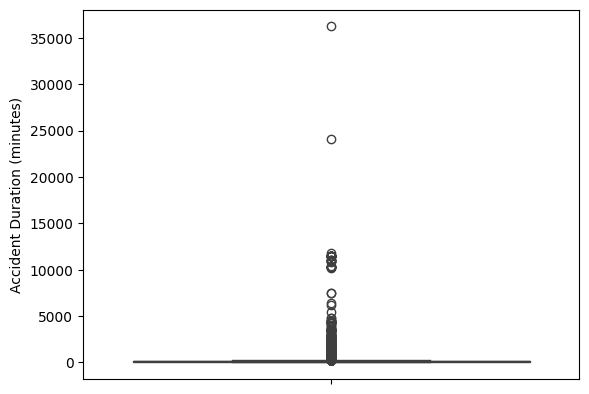

In [94]:
sns.boxplot( df['Accident Duration (minutes)'])

In [95]:
print(df['Accident Duration (minutes)'].describe())

long_accidents = df[df['Accident Duration (minutes)'] > 1440]
print(long_accidents[['Start_Time', 'End_Time', 'Accident Duration (minutes)']])


count    100000.000000
mean        136.480514
std         299.482075
min           5.000000
25%          75.850000
50%         126.450000
75%         136.866667
max       36232.000000
Name: Accident Duration (minutes), dtype: float64
                 Start_Time            End_Time  Accident Duration (minutes)
3644456 2023-03-30 18:21:00 2023-03-31 19:40:05                  1519.083333
3671405 2023-03-29 09:22:00 2023-03-30 11:54:46                  1592.766667
3677692 2023-03-28 19:25:03 2023-03-30 00:01:44                  1716.683333
3655515 2023-03-27 18:21:52 2023-03-29 07:08:52                  2207.000000
3662176 2023-03-27 10:17:00 2023-03-28 11:44:41                  1527.683333
...                     ...                 ...                          ...
4138637 2023-01-23 07:54:48 2023-01-30 23:59:00                 11044.200000
4964225 2023-01-23 07:50:00 2023-01-24 10:27:00                  1597.000000
5170596 2023-01-23 07:49:00 2023-01-30 23:59:00                 11050.000

In [96]:
# any accidennt lasting more than a day is suspicious and definitely an outlier:
df = df[df['Accident Duration (minutes)'] <= 1440]  # will keep ones that are less than a day


In [97]:
bins = [-1, 15, 30, 60, 180, 1441]
labels = ['<15min', '15-30min', '30-60min', '1-3hrs', '3hrs-1day']

df['Duration_Bin'] = pd.cut(df['Accident Duration (minutes)'], bins=bins, labels=labels, right=False)


In [98]:
df['Duration_Bin'].value_counts(normalize=True)

,proportion
Duration_Bin,
1-3hrs,0.729328
3hrs-1day,0.117150
30-60min,0.081713
15-30min,0.055727
<15min,0.016081


In [99]:
df['Duration_Bin'].isnull().sum()

np.int64(0)

In [100]:
df['IsWeekend'] = df['Accident Day of Week'].isin(['Saturday', 'Sunday'])

In [101]:
morning_rush = (df['Accident_Hour'] >= 7) & (df['Accident_Hour'] < 10)
evening_rush = (df['Accident_Hour'] >= 16) & (df['Accident_Hour'] < 19)
df['IsRushHour'] = morning_rush | evening_rush


In [102]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Accident_Hour',
       'Accident Day of Week', 'Time of Day', 'Accident Duration (minutes)',
       'Duration_Bin', 'IsWeekend', 'IsRushHour'],
      dtype='object')

In [103]:
road_features = ['Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction',
                 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
                 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop']

df['Number_of_Traffic_Obstacles'] = df[road_features].sum(axis=1)


In [104]:
df['Number_of_Traffic_Obstacles'].value_counts(normalize=True)


,proportion
Number_of_Traffic_Obstacles,
0,0.786231
1,0.157871
2,0.044558
3,0.010075
4,0.001095
5,0.000171


In [105]:
df['Temperature(F)'].describe()

,Temperature(F)
count,99556.000000
mean,58.595968
std,18.900650
min,-35.000000
25%,46.000000
50%,59.000000
75%,73.000000
max,140.000000


In [106]:
bins = [-51, 0, 32, 60, 80, 100, 151]
labels = ['Freezing', 'Cold', 'Cool', 'Mild', 'Warm', 'Hot']

df['Temperature_Ranges'] = pd.cut(df['Temperature(F)'], bins=bins, labels=labels, right=False)

print(df['Temperature_Ranges'].value_counts().sort_index())


Temperature_Ranges
Freezing      340
Cold         7861
Cool        41819
Mild        34909
Warm        14284
Hot           343
Name: count, dtype: int64


In [109]:
df['Temperature_Ranges'].isnull().sum()

np.int64(0)

<Axes: xlabel='Temperature(F)', ylabel='Count'>

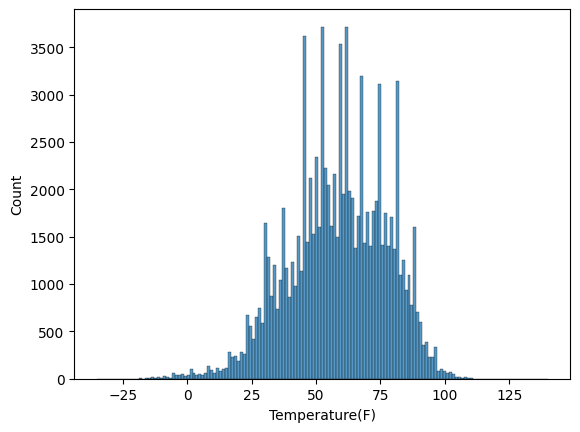

In [107]:
sns.histplot(df['Temperature(F)'])

In [108]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Accident_Hour',
       'Accident Day of Week', 'Time of Day', 'Accident Duration (minutes)',
       'Duration_Bin', 'IsWeekend', 'IsRushHour',
       'Number_of_Traffic_Obstacles', 'Temperature_Ranges'],
      dtype='object')

In [110]:
df['IsRushHour'].value_counts(normalize=True)

,proportion
IsRushHour,
False,0.616507
True,0.383493


In [111]:
df['IsSevere']=df['Severity']==4

In [112]:
df['IsSevere'].value_counts(normalize=True)

,proportion
IsSevere,
False,0.970057
True,0.029943


In [113]:
weather_columns=['Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)']
df[weather_columns].describe()

,Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,99556.000000,99556.000000,99556.000000,99556.000000,99556.000000,99556.000000
mean,56.955223,63.458260,29.307882,8.910650,7.898399,0.006989
std,21.357474,22.850436,1.201288,2.631443,5.634868,0.042035
min,-41.000000,1.000000,19.360000,0.000000,0.000000,-0.021153
25%,43.000000,46.000000,29.150000,10.000000,5.000000,0.000000
50%,59.000000,64.843974,29.660000,10.000000,7.000000,0.000000
75%,73.000000,83.000000,29.950000,10.000000,12.000000,0.000000
max,140.000000,121.973996,58.630000,80.000000,127.000000,2.310000


In [114]:
bins_hum = [-1, 30, 50, 70, 90, 120, 151]
labels_hum = ['Very Low', 'Low', 'Moderate', 'High', 'Very High', 'Extreme']
df['Humidity_Ranges'] = pd.cut(df['Humidity(%)'], bins=bins_hum, labels=labels_hum, right=False)


In [116]:
df['Humidity_Ranges'].isnull().sum()

np.int64(0)

In [115]:
bins_pres = [18, 28, 29, 30, 32, 40, 61]
labels_pres = ['Very Low', 'Low', 'Normal Low', 'Normal High', 'High', 'Very High']
df['Pressure_Ranges'] = pd.cut(df['Pressure(in)'], bins=bins_pres, labels=labels_pres, right=False)


In [117]:
df['Pressure_Ranges'].isnull().sum()

np.int64(0)

In [118]:
bins_vis = [-1, 1, 3, 5, 10, 20, 101]
labels_vis = ['Very Poor', 'Poor', 'Moderate', 'Good', 'Very Good', 'Excellent']
df['Visibility_Ranges'] = pd.cut(df['Visibility(mi)'], bins=bins_vis, labels=labels_vis, right=False)


In [119]:
df['Visibility_Ranges'].isnull().sum()

np.int64(0)

In [120]:
df['Visibility_Ranges'].value_counts(normalize=True)

,proportion
Visibility_Ranges,
Very Good,0.778949
Good,0.120123
Poor,0.045623
Moderate,0.034433
Very Poor,0.020310
Excellent,0.000562


In [121]:
df.groupby('IsSevere')['Visibility_Ranges'].value_counts(normalize=True)

IsSevere  Visibility_Ranges
False     Very Good            0.779053
          Good                 0.120166
          Poor                 0.045643
          Moderate             0.034408
          Very Poor            0.020160
          Excellent            0.000570
True      Very Good            0.775579
          Good                 0.118752
          Poor                 0.044951
          Moderate             0.035223
          Very Poor            0.025159
          Excellent            0.000335
Name: proportion, dtype: float64

In [122]:
bins_ws = [-1, 5, 15, 30, 50, 75, 131]
labels_ws = ['Calm', 'Light Breeze', 'Moderate', 'Strong', 'Very Strong', 'Extreme']
df['Wind_Speed_Bin'] = pd.cut(df['Wind_Speed(mph)'], bins=bins_ws, labels=labels_ws, right=False)


In [123]:
df['Wind_Speed_Bin'].value_counts(normalize=True, dropna=False)

,proportion
Wind_Speed_Bin,
Light Breeze,0.642362
Calm,0.238700
Moderate,0.115834
Strong,0.003054
Very Strong,0.000030
Extreme,0.000020


In [124]:
df['Precipitation(in)'].describe()

,Precipitation(in)
count,99556.000000
mean,0.006989
std,0.042035
min,-0.021153
25%,0.000000
50%,0.000000
75%,0.000000
max,2.310000


In [126]:
df=df[df['Precipitation(in)']>=0]

In [127]:
df['Precipitation(in)'].describe()

,Precipitation(in)
count,98877.000000
mean,0.007070
std,0.042166
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,2.310000


In [155]:
bins_precip = [-1, 0.01, 0.1, 0.5, 1.0, 2.5, 5.0]
labels_precip = ['No Precip.', 'Light', 'Moderate', 'Heavy', 'Very Heavy', 'Extreme']
df['Precipitation_Ranges'] = pd.cut(df['Precipitation(in)'], bins=bins_precip, labels=labels_precip, right=False)


/tmp/ipython-input-2918836266.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Precipitation_Ranges'] = pd.cut(df['Precipitation(in)'], bins=bins_precip, labels=labels_precip, right=False)


In [156]:
df['Precipitation_Ranges'].value_counts(normalize=True)

,proportion
Precipitation_Ranges,
No Precip.,0.896700
Light,0.083902
Moderate,0.018144
Heavy,0.001021
Very Heavy,0.000233
Extreme,0.000000


In [157]:
df['Precipitation_Ranges'].isnull().sum()

np.int64(0)

In [158]:
df['Precipitation_Ranges'].describe()

,Precipitation_Ranges
count,98877
unique,5
top,No Precip.
freq,88663


In [133]:
df['Precipitation_Ranges'].value_counts(normalize=True, dropna=False)

,proportion
Precipitation_Ranges,
None,0.896700
Light,0.083902
Moderate,0.018144
Heavy,0.001021
Very Heavy,0.000233
Extreme,0.000000


In [ ]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Accident_Hour',
       'Accident Day of Week', 'Time of Day', 'Accident Duration (minutes)',
       'Duration_Bin', 'IsWeekend', 'IsRushHour',
       'Number_of_Traffic_Obstacles', 'Temperature_Ranges', 'IsSevere',
       'Humidity_Ranges', 'Pressure_Ranges', 'Visibility_Ranges',
       'Wind_Speed_Bin', 'Precipitation_Ranges'],
      dtype='object')

In [134]:
df.isnull().sum()

,0
ID,0
Source,0
Severity,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
Distance(mi),0
Description,0
City,0


In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 98877 entries, 3662007 to 4933902
Data columns (total 50 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           98877 non-null  object        
 1   Source                       98877 non-null  object        
 2   Severity                     98877 non-null  int64         
 3   Start_Time                   98877 non-null  datetime64[ns]
 4   End_Time                     98877 non-null  datetime64[ns]
 5   Start_Lat                    98877 non-null  float64       
 6   Start_Lng                    98877 non-null  float64       
 7   Distance(mi)                 98877 non-null  float64       
 8   Description                  98877 non-null  object        
 9   City                         98877 non-null  object        
 10  County                       98877 non-null  object        
 11  State                        98877 non

In [136]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,City,...,IsWeekend,IsRushHour,Number_of_Traffic_Obstacles,Temperature_Ranges,IsSevere,Humidity_Ranges,Pressure_Ranges,Visibility_Ranges,Wind_Speed_Bin,Precipitation_Ranges
3662007,A-3682074,Source1,2,2023-03-31 23:30:00,2023-03-31 23:53:00,42.419172,-83.088509,0.911,Slow traffic on Chrysler Expy N - I-75 N - Chr...,Highland Park,...,False,False,0,Cool,False,High,Normal Low,Very Good,Strong,None
3659354,A-3678205,Source1,2,2023-03-31 23:25:30,2023-03-31 23:38:30,34.068219,-117.384067,0.463,Stationary traffic on San Bernardino Fwy E - I...,Bloomington,...,False,False,0,Cool,False,Moderate,Normal High,Very Good,Light Breeze,None
3665682,A-3687382,Source1,2,2023-03-31 23:19:00,2023-03-31 23:40:00,42.959427,-85.672227,0.129,Stationary traffic from exit [84A] to US-131 S...,Grand Rapids,...,False,False,1,Warm,False,Low,Normal Low,Very Good,Light Breeze,None
3677613,A-3705055,Source1,2,2023-03-31 23:12:55,2023-03-31 23:42:55,41.577819,-87.562150,0.188,At I-294 - Accident.,Lansing,...,False,False,0,Cool,False,Very Low,Normal Low,Very Good,Light Breeze,None
3656485,A-3673971,Source1,2,2023-03-31 23:09:00,2023-03-31 23:23:30,46.665441,-92.474491,0.762,Slow traffic on I-35 N from CR-4/Exit 227 (I-3...,Carlton,...,False,False,0,Cool,False,High,Normal Low,Good,Light Breeze,None


In [137]:
df.reset_index(drop=True, inplace=True)

In [138]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,City,...,IsWeekend,IsRushHour,Number_of_Traffic_Obstacles,Temperature_Ranges,IsSevere,Humidity_Ranges,Pressure_Ranges,Visibility_Ranges,Wind_Speed_Bin,Precipitation_Ranges
0,A-3682074,Source1,2,2023-03-31 23:30:00,2023-03-31 23:53:00,42.419172,-83.088509,0.911,Slow traffic on Chrysler Expy N - I-75 N - Chr...,Highland Park,...,False,False,0,Cool,False,High,Normal Low,Very Good,Strong,None
1,A-3678205,Source1,2,2023-03-31 23:25:30,2023-03-31 23:38:30,34.068219,-117.384067,0.463,Stationary traffic on San Bernardino Fwy E - I...,Bloomington,...,False,False,0,Cool,False,Moderate,Normal High,Very Good,Light Breeze,None
2,A-3687382,Source1,2,2023-03-31 23:19:00,2023-03-31 23:40:00,42.959427,-85.672227,0.129,Stationary traffic from exit [84A] to US-131 S...,Grand Rapids,...,False,False,1,Warm,False,Low,Normal Low,Very Good,Light Breeze,None
3,A-3705055,Source1,2,2023-03-31 23:12:55,2023-03-31 23:42:55,41.577819,-87.562150,0.188,At I-294 - Accident.,Lansing,...,False,False,0,Cool,False,Very Low,Normal Low,Very Good,Light Breeze,None
4,A-3673971,Source1,2,2023-03-31 23:09:00,2023-03-31 23:23:30,46.665441,-92.474491,0.762,Slow traffic on I-35 N from CR-4/Exit 227 (I-3...,Carlton,...,False,False,0,Cool,False,High,Normal Low,Good,Light Breeze,None


In [159]:
df['Precipitation_Ranges'].isnull().sum()

np.int64(0)

In [160]:
df.to_csv('us_accidents_.csv',index=False)

In [140]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [161]:
cl_df=pd.read_csv('us_accidents_.csv')
cl_df

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,City,...,IsWeekend,IsRushHour,Number_of_Traffic_Obstacles,Temperature_Ranges,IsSevere,Humidity_Ranges,Pressure_Ranges,Visibility_Ranges,Wind_Speed_Bin,Precipitation_Ranges
0,A-3682074,Source1,2,2023-03-31 23:30:00,2023-03-31 23:53:00,42.419172,-83.088509,0.911,Slow traffic on Chrysler Expy N - I-75 N - Chr...,Highland Park,...,False,False,0,Cool,False,High,Normal Low,Very Good,Strong,No Precip.
1,A-3678205,Source1,2,2023-03-31 23:25:30,2023-03-31 23:38:30,34.068219,-117.384067,0.463,Stationary traffic on San Bernardino Fwy E - I...,Bloomington,...,False,False,0,Cool,False,Moderate,Normal High,Very Good,Light Breeze,No Precip.
2,A-3687382,Source1,2,2023-03-31 23:19:00,2023-03-31 23:40:00,42.959427,-85.672227,0.129,Stationary traffic from exit [84A] to US-131 S...,Grand Rapids,...,False,False,1,Warm,False,Low,Normal Low,Very Good,Light Breeze,No Precip.
3,A-3705055,Source1,2,2023-03-31 23:12:55,2023-03-31 23:42:55,41.577819,-87.562150,0.188,At I-294 - Accident.,Lansing,...,False,False,0,Cool,False,Very Low,Normal Low,Very Good,Light Breeze,No Precip.
4,A-3673971,Source1,2,2023-03-31 23:09:00,2023-03-31 23:23:30,46.665441,-92.474491,0.762,Slow traffic on I-35 N from CR-4/Exit 227 (I-3...,Carlton,...,False,False,0,Cool,False,High,Normal Low,Good,Light Breeze,No Precip.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98872,A-4184940,Source1,2,2023-01-23 07:05:14,2023-01-23 08:22:59,34.543213,-92.752108,0.224,Incident on US-70 EB near STATE HWY-88 Right s...,Benton,...,False,True,0,Mild,False,Moderate,Normal Low,Good,Light Breeze,No Precip.
98873,A-3993019,Source1,2,2023-01-23 07:05:00,2023-01-23 11:52:30,34.045464,-118.167003,0.104,Incident on CORPORATE CENTER DR near HOUSE 160...,Monterey Park,...,False,True,0,Mild,False,Moderate,Normal Low,Very Good,Light Breeze,No Precip.
98874,A-4319307,Source1,2,2023-01-23 07:05:00,2023-01-23 07:58:00,30.580341,-90.504235,1.031,Stationary traffic on I-55 N from LA-442 (I-55...,Tickfaw,...,False,True,0,Hot,False,Very Low,Normal Low,Very Good,Light Breeze,No Precip.
98875,A-4687524,Source1,2,2023-01-23 07:04:03,2023-01-23 08:19:18,45.068829,-93.263480,0.830,Incident on I-694 WB near UNIVERSITY AVE Drive...,Minneapolis,...,False,True,0,Mild,False,Very Low,Normal Low,Very Good,Light Breeze,No Precip.


In [162]:
cl_df['Precipitation_Ranges'].isnull().sum()

np.int64(0)

In [163]:
cl_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98877 entries, 0 to 98876
Data columns (total 50 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           98877 non-null  object 
 1   Source                       98877 non-null  object 
 2   Severity                     98877 non-null  int64  
 3   Start_Time                   98877 non-null  object 
 4   End_Time                     98877 non-null  object 
 5   Start_Lat                    98877 non-null  float64
 6   Start_Lng                    98877 non-null  float64
 7   Distance(mi)                 98877 non-null  float64
 8   Description                  98877 non-null  object 
 9   City                         98877 non-null  object 
 10  County                       98877 non-null  object 
 11  State                        98877 non-null  object 
 12  Zipcode                      98877 non-null  object 
 13  Country         

In [164]:
cl_df["Start_Time"].dtype

dtype('O')

In [165]:
cl_df["Start_Time"] = pd.to_datetime(cl_df["Start_Time"])
cl_df["End_Time"] = pd.to_datetime(cl_df["End_Time"])

In [166]:
cl_df["Month"] = cl_df["Start_Time"].dt.month_name()

In [167]:
cl_df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Accident_Hour',
       'Accident Day of Week', 'Time of Day', 'Accident Duration (minutes)',
       'Duration_Bin', 'IsWeekend', 'IsRushHour',
       'Number_of_Traffic_Obstacles', 'Temperature_Ranges', 'IsSevere',
       'Humidity_Ranges', 'Pressure_Ranges', 'Visibility_Ranges',
       'Wind_Speed_Bin', 'Precipitation_Ranges', 'Month'],
      dtype='object')

In [168]:
cl_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98877 entries, 0 to 98876
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   ID                           98877 non-null  object        
 1   Source                       98877 non-null  object        
 2   Severity                     98877 non-null  int64         
 3   Start_Time                   98877 non-null  datetime64[ns]
 4   End_Time                     98877 non-null  datetime64[ns]
 5   Start_Lat                    98877 non-null  float64       
 6   Start_Lng                    98877 non-null  float64       
 7   Distance(mi)                 98877 non-null  float64       
 8   Description                  98877 non-null  object        
 9   City                         98877 non-null  object        
 10  County                       98877 non-null  object        
 11  State                        98877 non-nu

In [169]:
cl_df.isnull().sum()

,0
ID,0
Source,0
Severity,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
Distance(mi),0
Description,0
City,0


In [170]:
cl_df['Accident Duration (minutes)'].describe()

,Accident Duration (minutes)
count,98877.000000
mean,124.564584
std,100.163623
min,5.000000
25%,75.800000
50%,126.300000
75%,136.500000
max,1440.000000


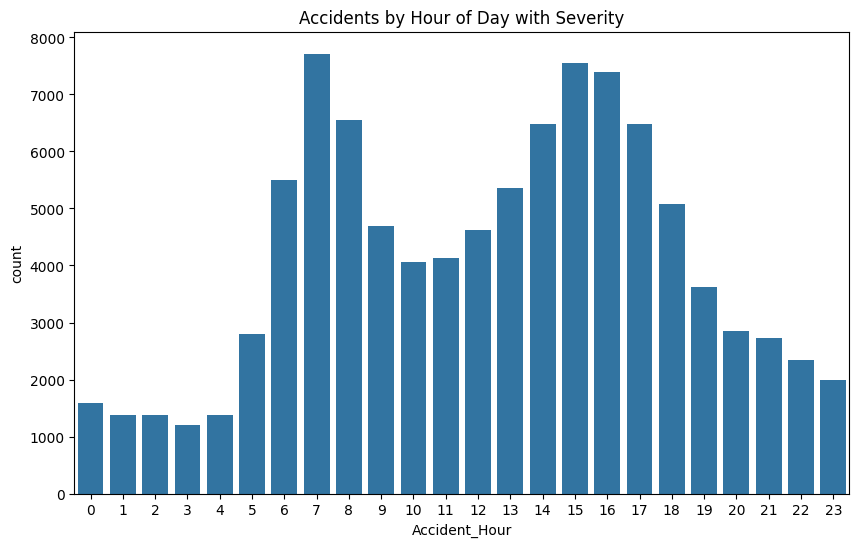

In [171]:
plt.figure(figsize=(10, 6))
sns.countplot(data=cl_df, x="Accident_Hour")
plt.title("Accidents by Hour of Day with Severity")
plt.show()


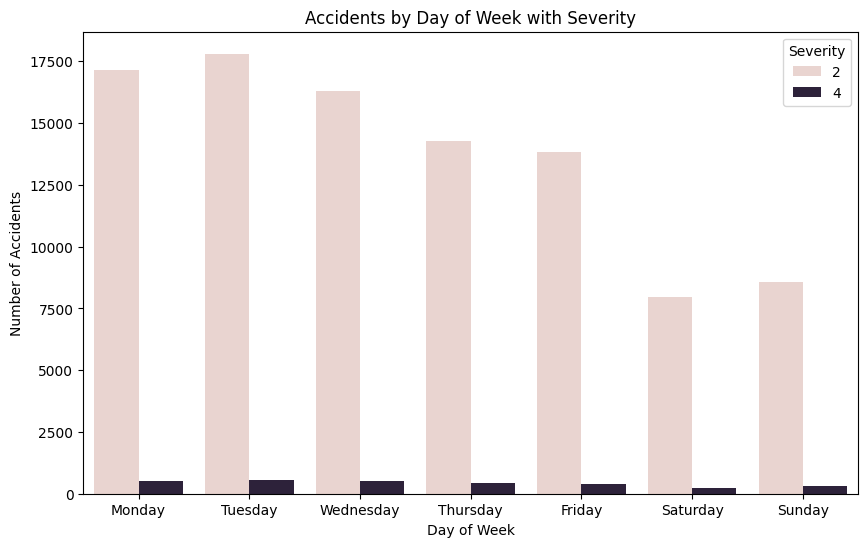

In [172]:
plt.figure(figsize=(10, 6))
sns.countplot(data=cl_df, x="Accident Day of Week", hue="Severity", order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"])
plt.title("Accidents by Day of Week with Severity")
plt.xlabel("Day of Week")
plt.ylabel("Number of Accidents")
plt.show()

In [173]:
cl_df["Month"].value_counts()

,count
Month,
January,41690
February,37049
March,20138


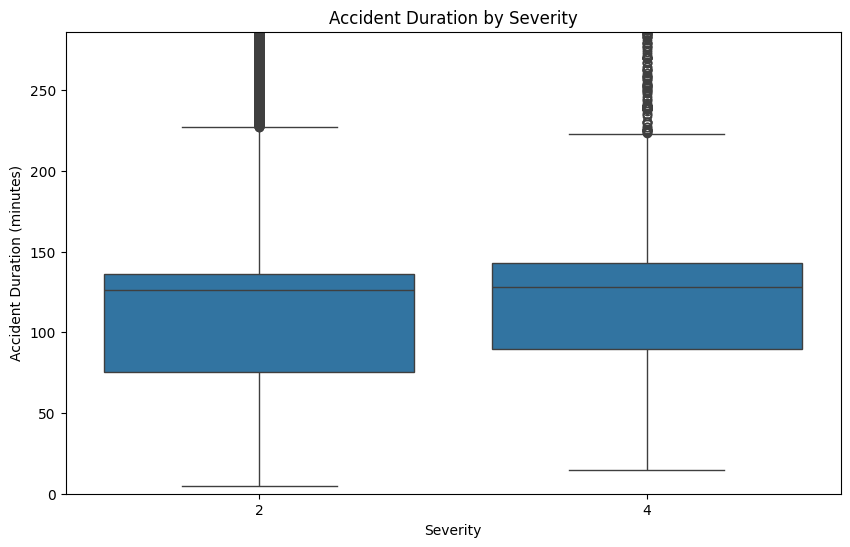

In [174]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=cl_df, x="Severity", y="Accident Duration (minutes)")
plt.title("Accident Duration by Severity")
plt.ylim(0, cl_df["Accident Duration (minutes)"].quantile(0.95))
plt.show()

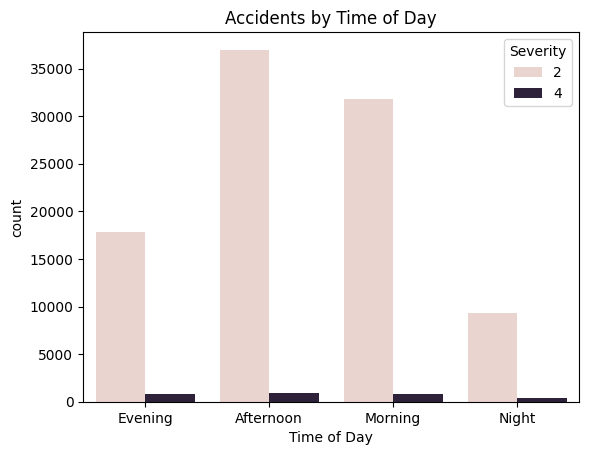

In [175]:
sns.countplot(data=cl_df, x="Time of Day", hue="Severity")
plt.title("Accidents by Time of Day")
plt.show()

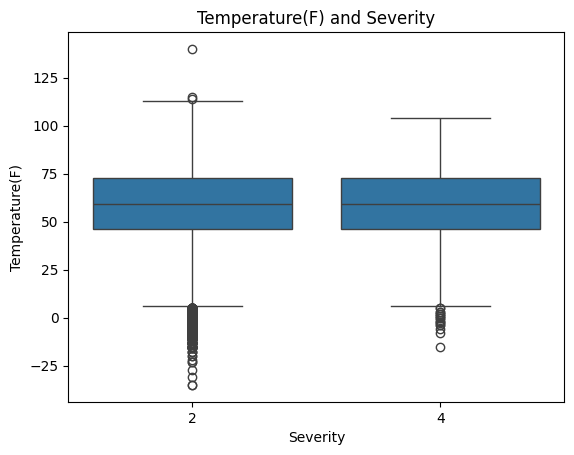

In [176]:
sns.boxplot(data=cl_df, x="Severity", y="Temperature(F)")
plt.title("Temperature(F) and Severity")
plt.show()

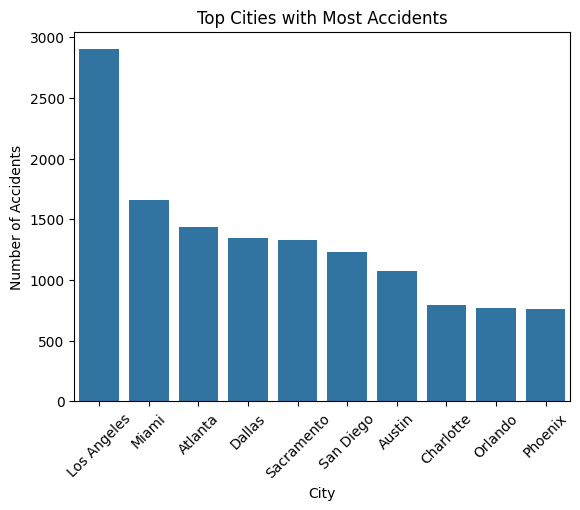

In [177]:
top_cities = cl_df['City'].value_counts().head(10).index
sns.countplot(data=cl_df[cl_df['City'].isin(top_cities)],
              x="City",
              order=top_cities)

plt.xticks(rotation=45)
plt.title("Top Cities with Most Accidents")
plt.xlabel("City")
plt.ylabel("Number of Accidents")
plt.show()

Text(0.5, 1.0, 'Duration Bin Distribution')

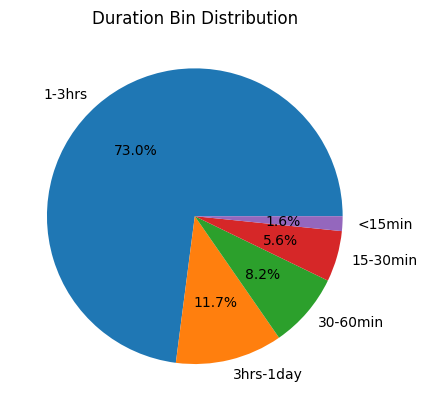

In [178]:
plt.pie(cl_df['Duration_Bin'].value_counts(), labels=cl_df['Duration_Bin'].value_counts().index, autopct='%1.1f%%')
plt.title('Duration Bin Distribution')

In [179]:
cl_df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Accident_Hour',
       'Accident Day of Week', 'Time of Day', 'Accident Duration (minutes)',
       'Duration_Bin', 'IsWeekend', 'IsRushHour',
       'Number_of_Traffic_Obstacles', 'Temperature_Ranges', 'IsSevere',
       'Humidity_Ranges', 'Pressure_Ranges', 'Visibility_Ranges',
       'Wind_Speed_Bin', 'Precipitation_Ranges', 'Month'],
      dtype='object')

In [184]:
state_counts = df['State'].value_counts().reset_index()
state_counts.columns = ['State', 'Count']
fig = px.choropleth(
    state_counts, locations='State', locationmode="USA-states", color='Count',
    scope="usa", title="Accidents per State"
)
fig.show()


In [185]:
fig = px.histogram(df, x='Precipitation_Ranges', title='Accidents by Precipitation')
fig.show()


In [186]:
fig = px.histogram(df, x='Visibility_Ranges', title='Accidents by Visibility')
fig.show()


In [188]:
fig = px.histogram(df, x='Wind_Speed_Bin', title='Accidents by Visibility')
fig.show()

In [199]:
fig = px.pie(df, names='Number_of_Traffic_Obstacles', title='Accidents by Number of Traffic Obstacles')
fig.show()

In [195]:
fig = px.pie(df,names='IsRushHour',
                   title='Rush Hour Accidents')
fig.show()


In [197]:
fig = px.pie(df,names='Time of Day',
                   title='Rush Hour Accidents')
fig.show()


In [198]:
fig = px.pie(df, names='IsWeekend', title='Accident Severity Distribution')
fig.show()

In [193]:
fig = px.pie(df, names='IsSevere', title='Accident Severity Distribution')
fig.show()

In [196]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Distance(mi)', 'Description', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Amenity', 'Bump', 'Crossing', 'Give_Way',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop', 'Accident_Hour',
       'Accident Day of Week', 'Time of Day', 'Accident Duration (minutes)',
       'Duration_Bin', 'IsWeekend', 'IsRushHour',
       'Number_of_Traffic_Obstacles', 'Temperature_Ranges', 'IsSevere',
       'Humidity_Ranges', 'Pressure_Ranges', 'Visibility_Ranges',
       'Wind_Speed_Bin', 'Precipitation_Ranges'],
      dtype='object')

In [200]:
fig = px.pie(df, names='Precipitation_Ranges', title='Accidents by Precipitation Range')
fig.show()

In [201]:
top_states = df['State'].value_counts().nlargest(10).reset_index()
top_states.columns = ['State', 'Count']
fig = px.pie(top_states, names='State', values='Count', title='Top 10 States by Accident Count')
fig.show()

In [202]:
fig = px.pie(df, names='Temperature_Ranges', title='Accidents by Temperature Range')
fig.show()

In [203]:
accidents_per_day = df.groupby(df['Start_Time'].dt.date).size().reset_index(name='Count')

fig = px.line(accidents_per_day, x='Start_Time', y='Count',
              title='Daily Accident Counts Over Time')
fig.show()


In [204]:
accidents_per_day_sev = df.groupby([df['Start_Time'].dt.date, 'Severity']).size().reset_index(name='Count')

fig = px.line(accidents_per_day_sev, x='Start_Time', y='Count', color='Severity',
              title='Daily Accidents Over Time by Severity')
fig.show()
